# Notes
+ nueroglancer capsule: https://codeocean.allenneuraldynamics.org/capsule/8222037/tree


In [1]:
import dask.array as da
from pathlib import Path

from ng_link import parsers
import numpy as np
import pathlib

import matplotlib.pyplot as plt


# notebook
import stitch_utils

# notebook reload
%load_ext autoreload
%autoreload 2


bucket_name = "aind-open-data"

In [102]:
r1 = "HCR_736963_2024-12-07_13-00-00"
r2 = "HCR_736963_2024-12-13_13-00-00"
r3 = "HCR_736963_2024-12-19_13-00-00"
r4 = "HCR_736963_2025-01-09_13-00-00"
r5 = "HCR_736963_2025-01-22_13-00-00"
round_names = [r1, r2, r3, r4, r5]

xml_list = ["stitching_single_channel.xml", "stitching_spot_channels.xml"]

xmls = {}
for i, round_n in enumerate(round_names):
    round_dict = {}
    for xml in xml_list:
        xml_path = f"{round_n}/{xml}"
        round_dict[xml.split("_")[1]] = xml_path


        local_path = Path(f'/home/matt.davis/code/hcr-stich/xml_data/')

        fn = local_path / xml_path
        fn.parent.mkdir(parents=True, exist_ok=True)

        # download xml from s3
        s3.download_file(
            Bucket=bucket_name,
            Key=xml_path,
            Filename=fn
        )
        print(f"Downloaded {xml_path} from S3")

    xmls[i+1] = round_dict

xmls

Downloaded HCR_736963_2024-12-07_13-00-00/stitching_single_channel.xml from S3
Downloaded HCR_736963_2024-12-07_13-00-00/stitching_spot_channels.xml from S3
Downloaded HCR_736963_2024-12-13_13-00-00/stitching_single_channel.xml from S3
Downloaded HCR_736963_2024-12-13_13-00-00/stitching_spot_channels.xml from S3
Downloaded HCR_736963_2024-12-19_13-00-00/stitching_single_channel.xml from S3
Downloaded HCR_736963_2024-12-19_13-00-00/stitching_spot_channels.xml from S3
Downloaded HCR_736963_2025-01-09_13-00-00/stitching_single_channel.xml from S3
Downloaded HCR_736963_2025-01-09_13-00-00/stitching_spot_channels.xml from S3
Downloaded HCR_736963_2025-01-22_13-00-00/stitching_single_channel.xml from S3
Downloaded HCR_736963_2025-01-22_13-00-00/stitching_spot_channels.xml from S3


{1: {'single': 'HCR_736963_2024-12-07_13-00-00/stitching_single_channel.xml',
  'spot': 'HCR_736963_2024-12-07_13-00-00/stitching_spot_channels.xml'},
 2: {'single': 'HCR_736963_2024-12-13_13-00-00/stitching_single_channel.xml',
  'spot': 'HCR_736963_2024-12-13_13-00-00/stitching_spot_channels.xml'},
 3: {'single': 'HCR_736963_2024-12-19_13-00-00/stitching_single_channel.xml',
  'spot': 'HCR_736963_2024-12-19_13-00-00/stitching_spot_channels.xml'},
 4: {'single': 'HCR_736963_2025-01-09_13-00-00/stitching_single_channel.xml',
  'spot': 'HCR_736963_2025-01-09_13-00-00/stitching_spot_channels.xml'},
 5: {'single': 'HCR_736963_2025-01-22_13-00-00/stitching_single_channel.xml',
  'spot': 'HCR_736963_2025-01-22_13-00-00/stitching_spot_channels.xml'}}

In [96]:
Path(local_path / xmls[1]["single"])

PosixPath('/home/matt.davis/code/hcr-stich/xml_data/HCR_736963_2024-12-19_13-00-00/stitching_single_channel.xml')

## check s3

In [47]:
import boto3
s3 = boto3.client("s3")
s3.list_buckets()

s3.list_objects_v2(Bucket=bucket_name)

{'ResponseMetadata': {'RequestId': '3D5Y4HZ03ZFPYZ6Q',
  'HostId': '1hZGIEhoMNbLTpDHtGhQT5XImskOO8jK8S+dyGmFVwyCfI7lkyIivKiJlldTG+v/qnijWuPfxf8=',
  'HTTPStatusCode': 200,
  'HTTPHeaders': {'x-amz-id-2': '1hZGIEhoMNbLTpDHtGhQT5XImskOO8jK8S+dyGmFVwyCfI7lkyIivKiJlldTG+v/qnijWuPfxf8=',
   'x-amz-request-id': '3D5Y4HZ03ZFPYZ6Q',
   'date': 'Tue, 25 Feb 2025 20:38:38 GMT',
   'x-amz-bucket-region': 'us-west-2',
   'content-type': 'application/xml',
   'transfer-encoding': 'chunked',
   'server': 'AmazonS3'},
  'RetryAttempts': 0},
 'IsTruncated': True,
 'Contents': [{'Key': 'HCR_000000-100_2024-04-01_00-00-00/SPIM.ome.zarr/.zgroup',
   'LastModified': datetime.datetime(2024, 4, 5, 19, 28, 46, tzinfo=tzutc()),
   'ETag': '"e20297935e73dd0154104d4ea53040ab"',
   'Size': 24,
   'StorageClass': 'STANDARD'},
  {'Key': 'HCR_000000-100_2024-04-01_00-00-00/SPIM.ome.zarr/R0_X_0000_Y_0000_Z_0000_ch_405.zarr/.zattrs',
   'LastModified': datetime.datetime(2024, 4, 5, 19, 28, 46, tzinfo=tzutc()),
   'ET

In [53]:
# check a bunch of datasets

response = s3.list_objects_v2(
    Bucket=bucket_name,
    Prefix="HCR_736963_2025-01-09_13-00-00/"  # This will show us all HCR datasets
)

if 'Contents' in response:
    print("\nAvailable HCR datasets:")
    for obj in response.get('Contents', []):
        print(obj['Key'])


Available HCR datasets:
HCR_736963_2025-01-09_13-00-00/SPIM.ome.zarr/.zgroup
HCR_736963_2025-01-09_13-00-00/SPIM.ome.zarr/Tile_X_0000_Y_0000_Z_0000_ch_405.zarr/.zattrs
HCR_736963_2025-01-09_13-00-00/SPIM.ome.zarr/Tile_X_0000_Y_0000_Z_0000_ch_405.zarr/.zgroup
HCR_736963_2025-01-09_13-00-00/SPIM.ome.zarr/Tile_X_0000_Y_0000_Z_0000_ch_405.zarr/0/.zarray
HCR_736963_2025-01-09_13-00-00/SPIM.ome.zarr/Tile_X_0000_Y_0000_Z_0000_ch_405.zarr/0/0/0/0/0/0
HCR_736963_2025-01-09_13-00-00/SPIM.ome.zarr/Tile_X_0000_Y_0000_Z_0000_ch_405.zarr/0/0/0/0/0/1
HCR_736963_2025-01-09_13-00-00/SPIM.ome.zarr/Tile_X_0000_Y_0000_Z_0000_ch_405.zarr/0/0/0/0/0/10
HCR_736963_2025-01-09_13-00-00/SPIM.ome.zarr/Tile_X_0000_Y_0000_Z_0000_ch_405.zarr/0/0/0/0/0/11
HCR_736963_2025-01-09_13-00-00/SPIM.ome.zarr/Tile_X_0000_Y_0000_Z_0000_ch_405.zarr/0/0/0/0/0/12
HCR_736963_2025-01-09_13-00-00/SPIM.ome.zarr/Tile_X_0000_Y_0000_Z_0000_ch_405.zarr/0/0/0/0/0/13
HCR_736963_2025-01-09_13-00-00/SPIM.ome.zarr/Tile_X_0000_Y_0000_Z_0000_ch

In [57]:
# check rounds
ds_path = r1
response = s3.list_objects_v2(
    Bucket=bucket_name,
    Prefix=stitch_rn28s_xml_path  # This will show us all HCR datasets
)
if 'Contents' in response:
    print("\nAvailable HCR datasets:")
    for obj in response.get('Contents', []):
        print(obj['Key'])


Available HCR datasets:
HCR_736963_2024-12-19_13-00-00/stitching_single_channel.xml


In [58]:
# check if xml exists on s3
if s3.head_object(Bucket=bucket_name, Key=stitch_rn28s_xml_path):
    print("stitch_rn28s_xml_path exists")
else:
    print("stitch_rn28s_xml_path does not exist")

stitch_rn28s_xml_path exists


# 1) Start load XML and extract tile info

In [ ]:
def map_channels_to_keys(tile_dict):
    """
    Create a mapping from channel names to lists of tile IDs.
    
    Args:
        tile_dict: Dictionary mapping IDs to tile names
                  Example: {0: 'Tile_X_0000_Y_0000_Z_0000_ch_405.zarr', ...}
    
    Returns:
        Dictionary mapping channel names to lists of tile IDs
        Example: {'405': [0, 1, 2, 3], '488': [4, 5, 6, 7]}
    """
    # Initialize dictionary to hold keys by channel
    channel_to_keys = {}
    
    # Process each tile
    for tile_id, tile_name in tile_dict.items():
        # Extract channel from tile name
        try:
            if '_ch_' in tile_name:
                channel = tile_name.split('_ch_')[1].split('.')[0]
            elif '.ch' in tile_name:
                channel = tile_name.split('.ch')[1].split('.')[0]
            else:
                parts = tile_name.split('_')
                for i, part in enumerate(parts):
                    if part == 'ch' and i+1 < len(parts):
                        channel = parts[i+1]
                        break
                else:
                    channel = 'unknown'
        except:
            channel = 'unknown'
        
        # Add key to channel list
        if channel not in channel_to_keys:
            channel_to_keys[channel] = []
        
        channel_to_keys[channel].append(tile_id)
    
    return channel_to_keys

In [135]:
# local- original
xml_path = "/allen/programs/mindscope/workgroups/learning/mattd/hcr/bigstitcher_763963_r4.xml"

In [137]:
# new 
xml_path = Path(local_path / xmls[2]["spot"])
print(xml_path)

/home/matt.davis/code/hcr-stich/xml_data/HCR_736963_2024-12-13_13-00-00/stitching_spot_channels.xml


In [145]:

dataset_path = parsers.XmlParser.extract_dataset_path(xml_path=xml_path)
# if start with /data, remove it
if dataset_path.startswith('/data/'):
    dataset_path = dataset_path[len('/data/'):]

tile_names = parsers.XmlParser.extract_tile_paths(xml_path=xml_path)
tile_transforms = parsers.XmlParser.extract_tile_transforms(xml_path=xml_path)
tile_info = parsers.XmlParser.extract_info(xml_path=xml_path)
net_transforms = stitch_utils.calculate_net_transforms(tile_transforms)

print(dataset_path)
print(tile_names)
print(len(tile_names))


HCR_736963_2024-12-13_13-00-00/radial_correction.ome.zarr/
{0: 'Tile_X_0000_Y_0000_Z_0000_ch_488.zarr', 1: 'Tile_X_0000_Y_0000_Z_0000_ch_514.zarr', 2: 'Tile_X_0000_Y_0000_Z_0000_ch_561.zarr', 3: 'Tile_X_0000_Y_0000_Z_0000_ch_638.zarr', 4: 'Tile_X_0000_Y_0001_Z_0000_ch_488.zarr', 5: 'Tile_X_0000_Y_0001_Z_0000_ch_514.zarr', 6: 'Tile_X_0000_Y_0001_Z_0000_ch_561.zarr', 7: 'Tile_X_0000_Y_0001_Z_0000_ch_638.zarr', 8: 'Tile_X_0000_Y_0002_Z_0000_ch_488.zarr', 9: 'Tile_X_0000_Y_0002_Z_0000_ch_514.zarr', 10: 'Tile_X_0000_Y_0002_Z_0000_ch_561.zarr', 11: 'Tile_X_0000_Y_0002_Z_0000_ch_638.zarr', 12: 'Tile_X_0000_Y_0003_Z_0000_ch_488.zarr', 13: 'Tile_X_0000_Y_0003_Z_0000_ch_514.zarr', 14: 'Tile_X_0000_Y_0003_Z_0000_ch_561.zarr', 15: 'Tile_X_0000_Y_0003_Z_0000_ch_638.zarr', 16: 'Tile_X_0000_Y_0004_Z_0000_ch_488.zarr', 17: 'Tile_X_0000_Y_0004_Z_0000_ch_514.zarr', 18: 'Tile_X_0000_Y_0004_Z_0000_ch_561.zarr', 19: 'Tile_X_0000_Y_0004_Z_0000_ch_638.zarr', 20: 'Tile_X_0000_Y_0005_Z_0000_ch_488.zarr', 21: '

In [128]:
channel_keys = map_channels_to_keys(tile_names)

# print unique channels and length of each
for channel, keys in channel_keys.items():
    print(f"{channel}: {len(keys)}")


488: 62
514: 62
561: 62
638: 62
405: 6


In [130]:
channel = '561'
tile_names = {key: tile_names[key] for key in channel_keys[channel]}
tile_transforms = {key: tile_transforms[key] for key in channel_keys[channel]}
#tile_info = {key: tile_info[key] for key in channel_keys[channel]}
net_transforms = {key: net_transforms[key] for key in channel_keys[channel]}


tile_names[tile_n]

## check shape with zarr

In [134]:
tile_names[tile_n]

'Tile_X_0001_Y_0001_Z_0000_ch_561.zarr'

In [147]:

pyramid_level = 2
tile_n = 42

tile_array_loc = f"{dataset_path}{tile_names[tile_n]}/{pyramid_level}"
print(tile_array_loc)

zarr_path_path = f"s3://{bucket_name}/{tile_array_loc}"
print(zarr_path_path)
# load the zarr path with dask
tile_data = da.from_zarr(
    url=zarr_path_path,
    storage_options={'anon': False}
)

print(f"Tile shape: {tile_data.shape}")
tile_data = tile_data.squeeze()
print(tile_data.shape)


HCR_736963_2024-12-13_13-00-00/radial_correction.ome.zarr/Tile_X_0001_Y_0001_Z_0000_ch_561.zarr/2
s3://aind-open-data/HCR_736963_2024-12-13_13-00-00/radial_correction.ome.zarr/Tile_X_0001_Y_0001_Z_0000_ch_561.zarr/2
Tile shape: (1, 1, 418, 477, 477)
(418, 477, 477)


# 2) Get adjacent tiles

In [149]:
# print tile names 
# for key, tile_name in tile_info[1].items():
#     print(tile_name)
#     x, y, z = parse_tile_name(tile_name)
#     print(x, y, z)


# grid dimensions
all_tiles = list(tile_names.values())
print(stitch_utils.get_tile_grid_dimensions(all_tiles))

# check single adjacent tile
tile = 'Tile_X_0000_Y_0002_Z_0000_ch_405.zarr'
for adj_tile in stitch_utils.get_adjacent_tiles(tile, all_tiles, include_diagonals=False):
    print(adj_tile)


(7, 9, 1)
Tile_X_0000_Y_0003_Z_0000_ch_488.zarr
Tile_X_0001_Y_0002_Z_0000_ch_488.zarr
Tile_X_0000_Y_0001_Z_0000_ch_488.zarr


In [153]:
# Get all adjacent pairs
pairs = stitch_utils.get_all_adjacent_pairs(tile_names, include_diagonals=False)

# Analyze the transformations between pairs
stats = stitch_utils.analyze_adjacent_pairs(pairs, tile_names, net_transforms)

print(f"Found {stats['n_pairs']} adjacent tile pairs")
print("\nX translation differences:")
print(f"Mean: {stats['x_translation']['mean']:.2f}")
print(f"Std:  {stats['x_translation']['std']:.2f}")
print(f"Min:  {stats['x_translation']['min']:.2f}")
print(f"Max:  {stats['x_translation']['max']:.2f}")

Found 442 adjacent tile pairs

X translation differences:
Mean: 895.49
Std:  911.85
Min:  0.00
Max:  1825.00


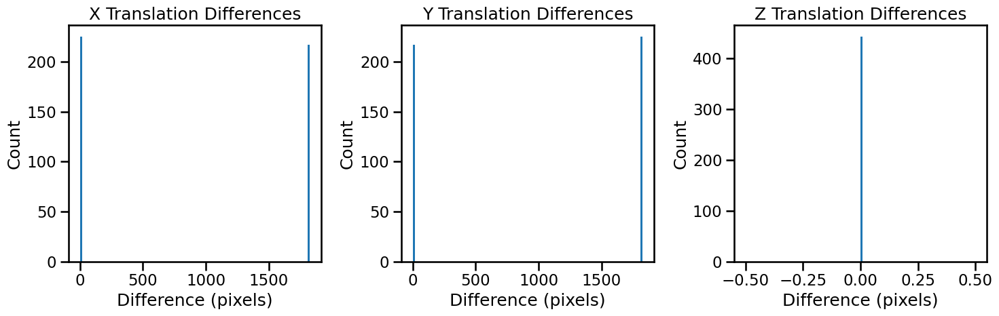

In [154]:
def plot_transform_differences_histogram(stats, bins=50):
    fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(15, 5))

    # Plot x_diffs histogram
    ax1.hist(stats['x_translation']['x_diffs'], bins=100)
    ax1.set_title('X Translation Differences')
    ax1.set_xlabel('Difference (pixels)')
    ax1.set_ylabel('Count')

    # Plot y_diffs histogram
    ax2.hist(stats['y_translation']['y_diffs'], bins=100)
    ax2.set_title('Y Translation Differences')
    ax2.set_xlabel('Difference (pixels)')
    ax2.set_ylabel('Count')

    # Plot z_diffs histogram
    ax3.hist(stats['z_translation']['z_diffs'], bins=100)
    ax3.set_title('Z Translation Differences')
    ax3.set_xlabel('Difference (pixels)')
    ax3.set_ylabel('Count')

    # Adjust layout to prevent overlap
    plt.tight_layout()
    plt.show()

plot_transform_differences_histogram(stats)

## outliers in transform differences

In [152]:
# TODO: account for non shift in middle tiles of x and y (add tile_dims + overlap to analyze_outlier_pairs)

outliers = stitch_utils.analyze_outlier_pairs(pairs, tile_names, net_transforms)

# Print information about the most extreme differences
print("\nLargest X differences:")
for o in outliers['y'][:10]:  # Show top 5
    print(f"\nDifference: {o['difference']:.2f} pixels")
    print(f"Tile 1: {o['tile1']['name']} at position {o['tile1']['position']}")
    print(f"Tile 2: {o['tile2']['name']} at position {o['tile2']['position']}")

{'x': np.float64(1807.3394338889198), 'y': np.float64(1840.3395221004207), 'z': np.float64(0.0)}

Largest X differences:


# 3) Plot tiles 

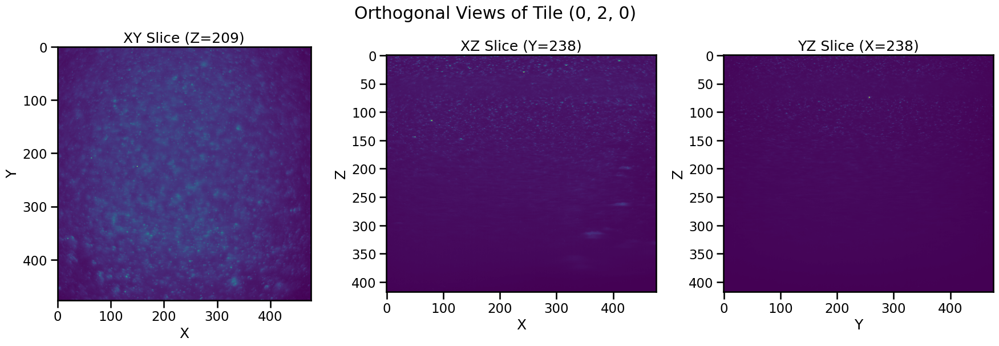

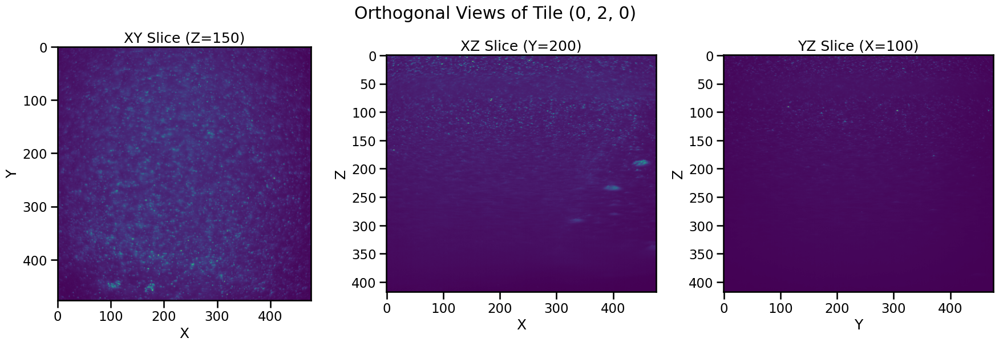

(<Figure size 1800x600 with 3 Axes>,
 (<Axes: title={'center': 'XY Slice (Z=150)'}, xlabel='X', ylabel='Y'>,
  <Axes: title={'center': 'XZ Slice (Y=200)'}, xlabel='X', ylabel='Z'>,
  <Axes: title={'center': 'YZ Slice (X=100)'}, xlabel='Y', ylabel='Z'>))

In [155]:
tile_name = pairs[20][0]
pyramid_level = 2

tile_data = stitch_utils.load_tile_data(tile_name, bucket_name, dataset_path, 
                                        pyramid_level,dims_order=(2,1,0))

# Use middle of volume
stitch_utils.plot_tile_orthogonal_views(tile_data, tile_name)

# Or specify custom center points
center_points = {'x': 100, 'y': 200, 'z': 150}
stitch_utils.plot_tile_orthogonal_views(tile_data, tile_name, center_points=center_points)


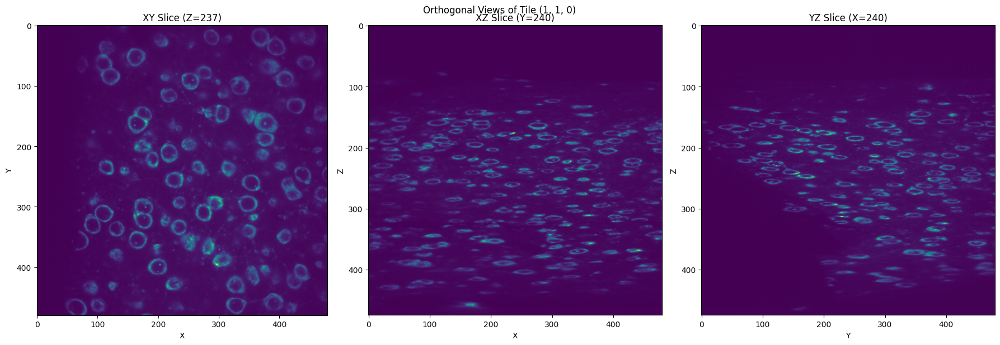

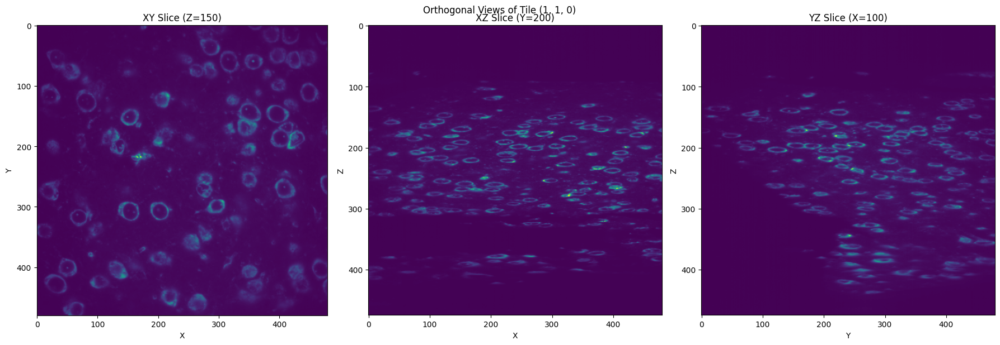

(<Figure size 1800x600 with 3 Axes>,
 (<Axes: title={'center': 'XY Slice (Z=150)'}, xlabel='X', ylabel='Y'>,
  <Axes: title={'center': 'XZ Slice (Y=200)'}, xlabel='X', ylabel='Z'>,
  <Axes: title={'center': 'YZ Slice (X=100)'}, xlabel='Y', ylabel='Z'>))

In [231]:
tile_name = pairs[20][0]
pyramid_level = 2

tile_data = stitch_utils.load_tile_data(tile_name, bucket_name, dataset_path, 
                                        pyramid_level,dims_order=(2,1,0))

# Use middle of volume
stitch_utils.plot_tile_orthogonal_views(tile_data, tile_name)

# Or specify custom center points
center_points = {'x': 100, 'y': 200, 'z': 150}
stitch_utils.plot_tile_orthogonal_views(tile_data, tile_name, center_points=center_points)

# 4) Accutance


In [321]:
tile_1_name = pairs[56][0]
tile_2_name = pairs[56][1]

tile1_data = stitch_utils.load_tile_data(tile_1_name, bucket_name, dataset_path, pyramid_level)
tile2_data = stitch_utils.load_tile_data(tile_2_name, bucket_name, dataset_path, pyramid_level)

# slice 
z_slice = 300
tile1_slice = tile1_data[:,:,z_slice]
tile2_slice = tile2_data[:,:,z_slice]


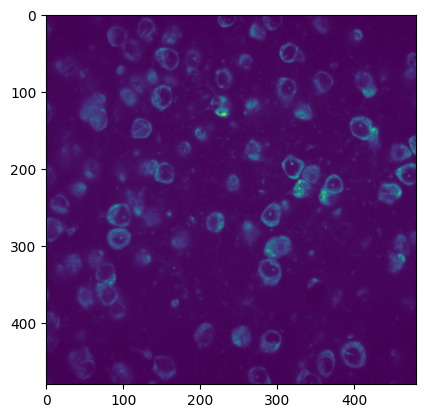

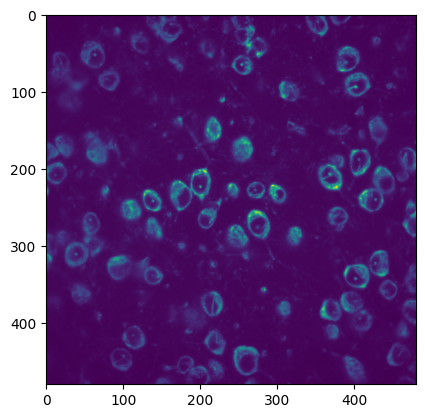

In [322]:
# plot the slices
plt.imshow(tile1_slice)
plt.show()  
plt.imshow(tile2_slice)
plt.show()



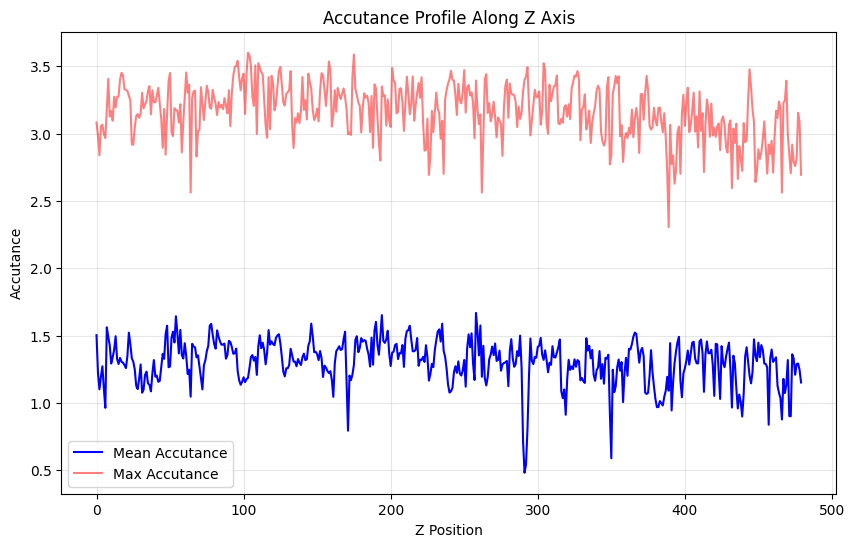

In [323]:
fig, ax, profile = stitch_utils.plot_accutance_profile(tile1_data, axis='z')

(<Figure size 1500x600 with 2 Axes>,
 [<Axes: title={'center': 'Accutance Profiles Comparison'}, xlabel='Z Position', ylabel='Accutance'>,
  <Axes: title={'center': 'Accutance Difference (Tile 1 - Tile 2)'}, xlabel='Z Position', ylabel='Accutance Difference'>],
 {'tile1': {'positions': range(0, 480),
   'mean_accutance': [np.float64(1.5031003700840482),
    np.float64(1.2218324723856056),
    np.float64(1.1008737904761254),
    np.float64(1.194118148893778),
    np.float64(1.2720692229759194),
    np.float64(1.1058786237571723),
    np.float64(0.9634519571003769),
    np.float64(1.5611636621180718),
    np.float64(1.4906725002223629),
    np.float64(1.4276979769843419),
    np.float64(1.2924379066887002),
    np.float64(1.3381762281567926),
    np.float64(1.394622083550531),
    np.float64(1.4948484635006871),
    np.float64(1.3265503225704651),
    np.float64(1.2887944334690633),
    np.float64(1.3340066175662795),
    np.float64(1.306220241307259),
    np.float64(1.2979731799661103),

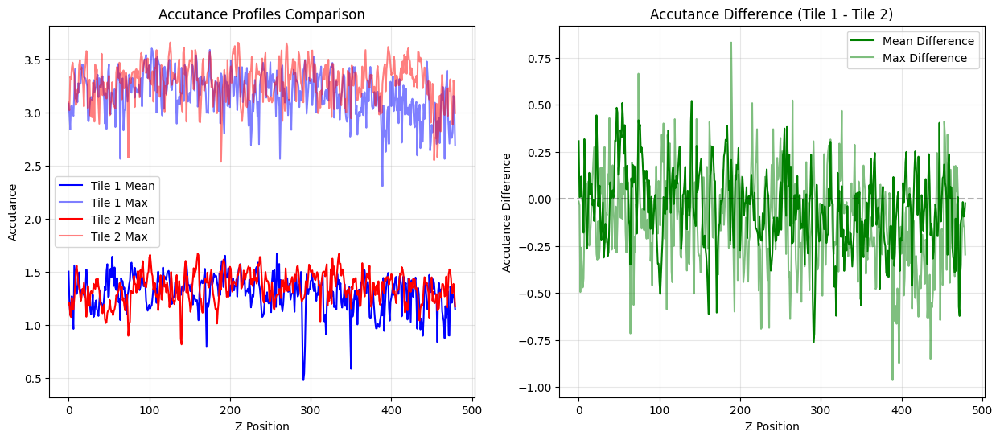

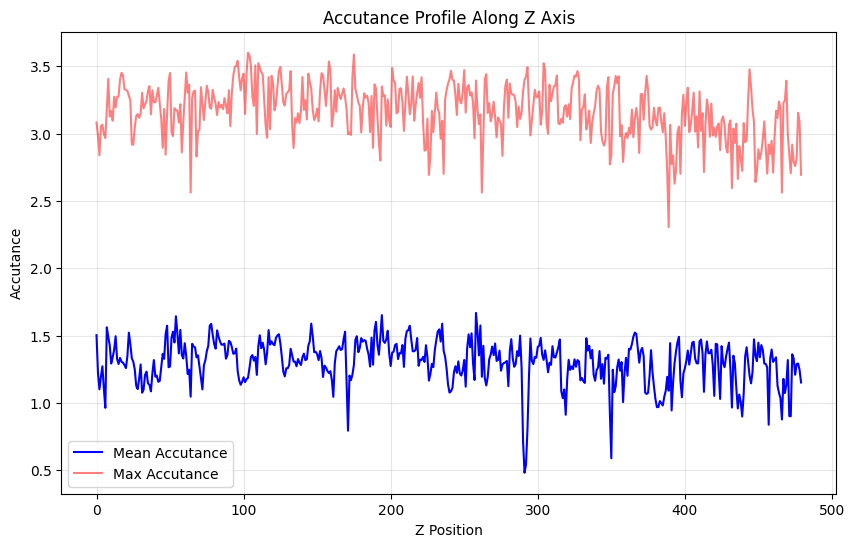

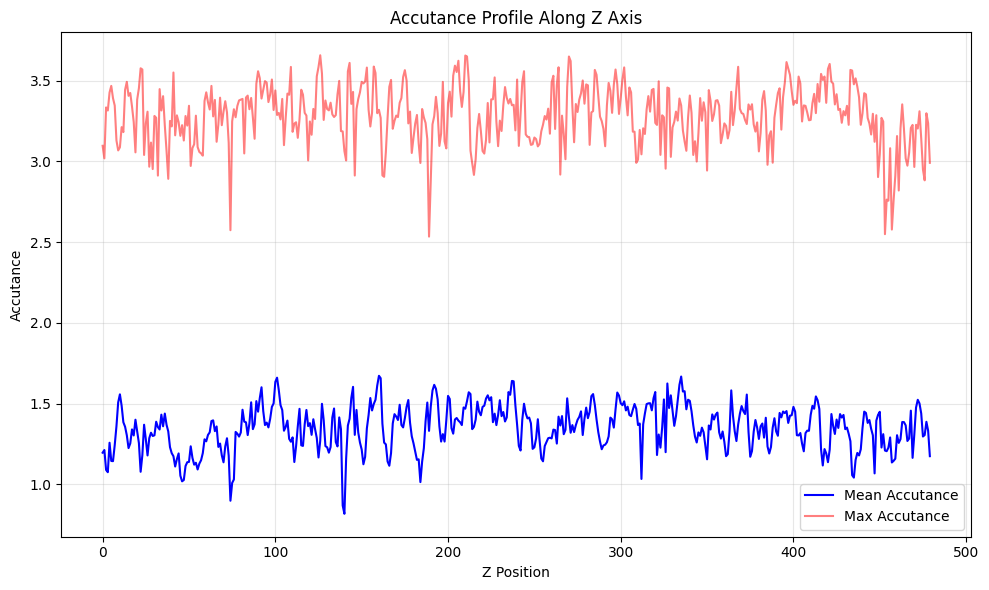

In [312]:
stitch_utils.plot_accutance_comparison(tile1_data, tile2_data, axis='z')

stitch_utils.plot_accutance_comparison(tile1_data, tile2_data, axis='z')

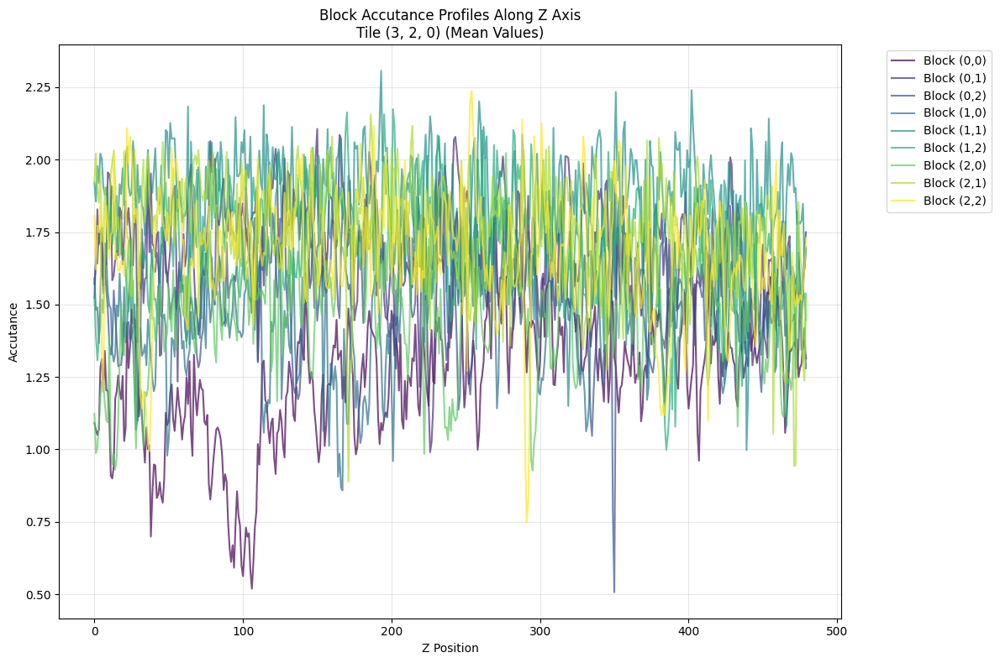

In [313]:
fig, ax, profiles = stitch_utils.plot_block_accutance_profiles(tile1_data, tile_1_name, axis='z')

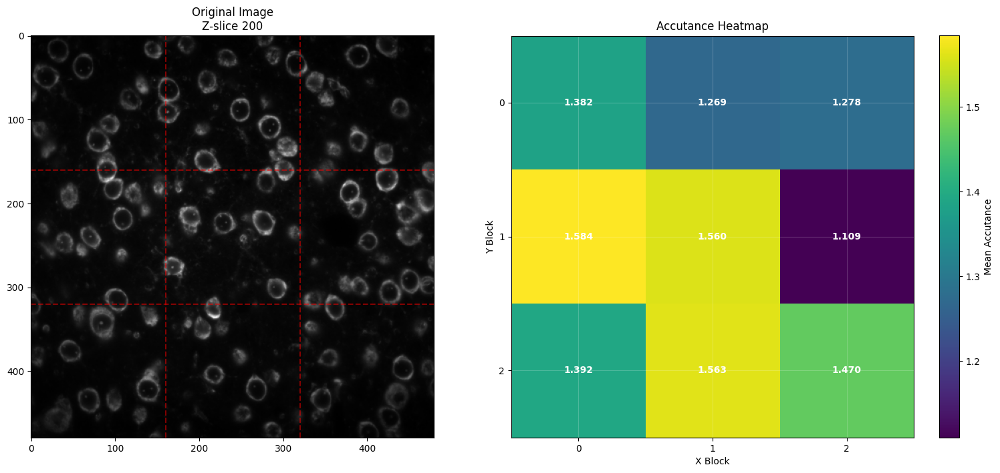

In [327]:
fig, ax, values = stitch_utils.plot_block_accutance_heatmap(tile1_data, z_slice=200, n_blocks=3, percentile_threshold=99)

fig, ax, profiles = stitch_utils.plot_block_accutance_profiles(tile1_data, tile_1_name, axis='z')

## All tiles heatmap

In [332]:
grid_data = stitch_utils.calculate_tile_grid_block_accutance(
    tile_names, bucket_name, dataset_path,
    z_slice=100, n_blocks=3, pyramid_level=2
)


Processing tile Tile_X_0000_Y_0000_Z_0000_ch_405.zarr
Processing tile Tile_X_0000_Y_0001_Z_0000_ch_405.zarr
Processing tile Tile_X_0000_Y_0002_Z_0000_ch_405.zarr
Processing tile Tile_X_0000_Y_0003_Z_0000_ch_405.zarr
Processing tile Tile_X_0000_Y_0004_Z_0000_ch_405.zarr
Processing tile Tile_X_0000_Y_0005_Z_0000_ch_405.zarr
Processing tile Tile_X_0000_Y_0006_Z_0000_ch_405.zarr
Processing tile Tile_X_0000_Y_0007_Z_0000_ch_405.zarr
Processing tile Tile_X_0000_Y_0008_Z_0000_ch_405.zarr
Processing tile Tile_X_0001_Y_0000_Z_0000_ch_405.zarr
Processing tile Tile_X_0001_Y_0001_Z_0000_ch_405.zarr
Processing tile Tile_X_0001_Y_0002_Z_0000_ch_405.zarr
Processing tile Tile_X_0001_Y_0003_Z_0000_ch_405.zarr
Processing tile Tile_X_0001_Y_0004_Z_0000_ch_405.zarr
Processing tile Tile_X_0001_Y_0005_Z_0000_ch_405.zarr
Processing tile Tile_X_0001_Y_0006_Z_0000_ch_405.zarr
Processing tile Tile_X_0001_Y_0007_Z_0000_ch_405.zarr
Processing tile Tile_X_0001_Y_0008_Z_0000_ch_405.zarr
Processing tile Tile_X_0002_

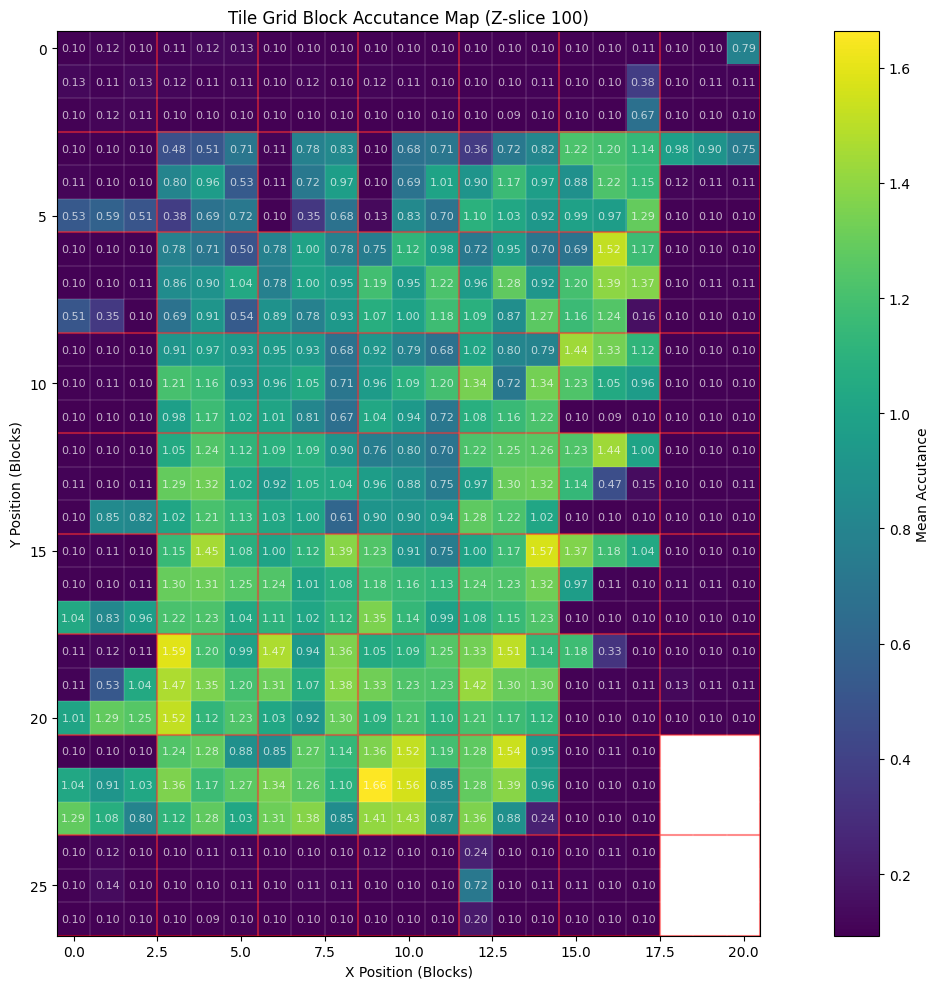

In [334]:
fig, ax = stitch_utils.plot_tile_grid_block_accutance(grid_data, z_slice=100)

Processing tile Tile_X_0000_Y_0000_Z_0000_ch_405.zarr
Processing tile Tile_X_0000_Y_0001_Z_0000_ch_405.zarr
Processing tile Tile_X_0000_Y_0002_Z_0000_ch_405.zarr
Processing tile Tile_X_0000_Y_0003_Z_0000_ch_405.zarr
Processing tile Tile_X_0000_Y_0004_Z_0000_ch_405.zarr
Processing tile Tile_X_0000_Y_0005_Z_0000_ch_405.zarr
Processing tile Tile_X_0000_Y_0006_Z_0000_ch_405.zarr
Processing tile Tile_X_0000_Y_0007_Z_0000_ch_405.zarr
Processing tile Tile_X_0000_Y_0008_Z_0000_ch_405.zarr
Processing tile Tile_X_0001_Y_0000_Z_0000_ch_405.zarr
Processing tile Tile_X_0001_Y_0001_Z_0000_ch_405.zarr
Processing tile Tile_X_0001_Y_0002_Z_0000_ch_405.zarr
Processing tile Tile_X_0001_Y_0003_Z_0000_ch_405.zarr
Processing tile Tile_X_0001_Y_0004_Z_0000_ch_405.zarr
Processing tile Tile_X_0001_Y_0005_Z_0000_ch_405.zarr
Processing tile Tile_X_0001_Y_0006_Z_0000_ch_405.zarr
Processing tile Tile_X_0001_Y_0007_Z_0000_ch_405.zarr
Processing tile Tile_X_0001_Y_0008_Z_0000_ch_405.zarr
Processing tile Tile_X_0002_

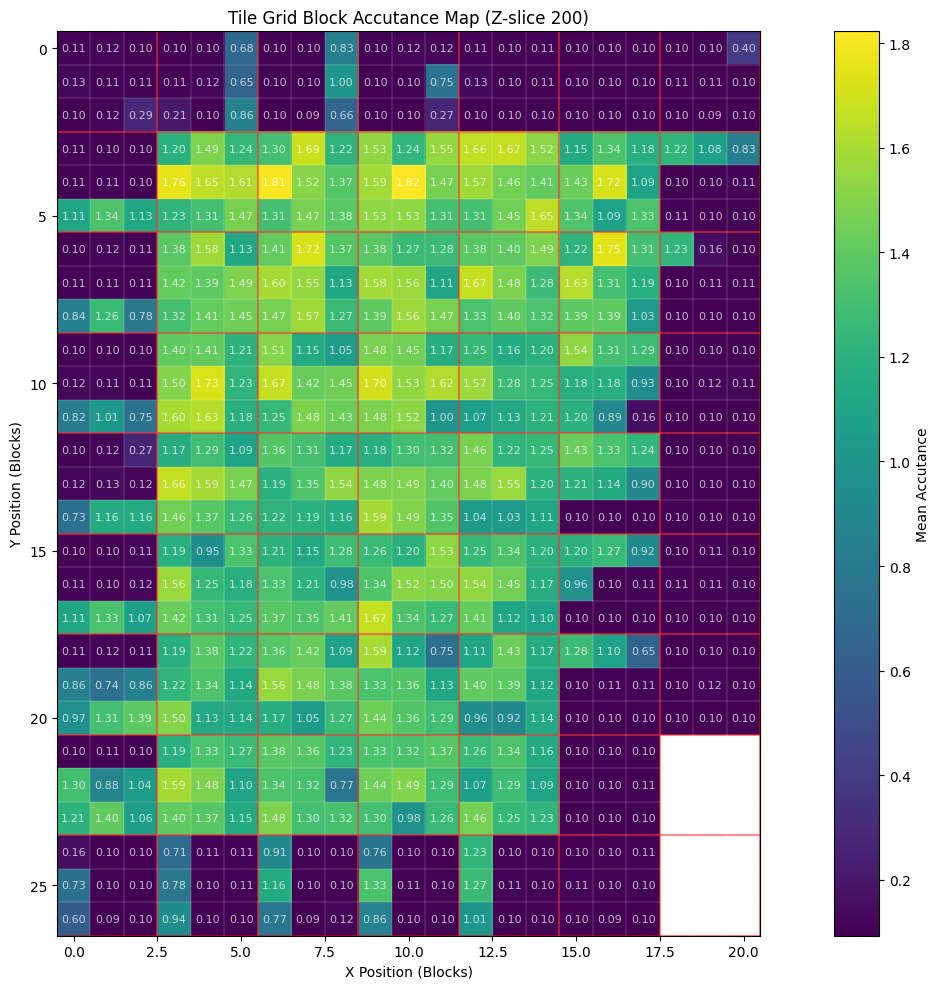

In [335]:
z_slice = 200
grid_data = stitch_utils.calculate_tile_grid_block_accutance(
    tile_names, bucket_name, dataset_path,
    z_slice=z_slice, n_blocks=3, pyramid_level=2
)
fig, ax = stitch_utils.plot_tile_grid_block_accutance(grid_data, z_slice=z_slice)

## normalize accutance



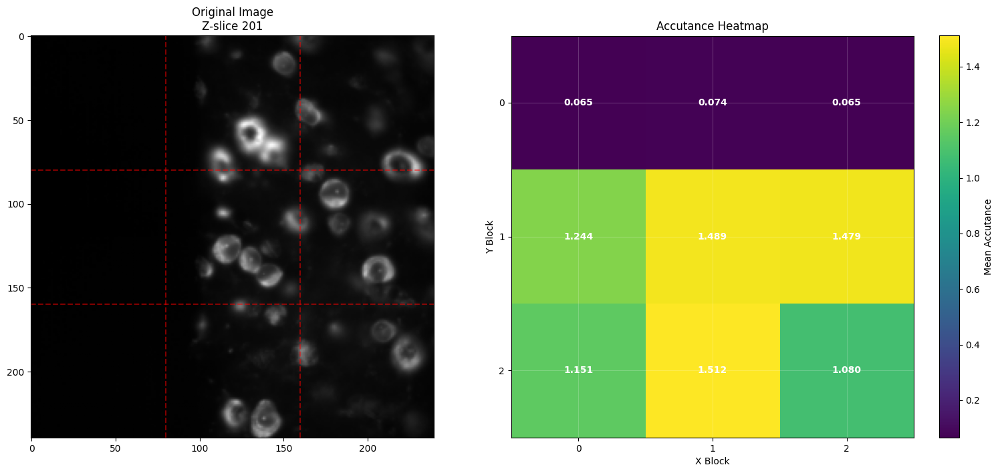

In [15]:
btile_name = tile_names[10]
tile1_data = stitch_utils.load_tile_data(tile_name, bucket_name, dataset_path, 
                                        pyramid_level,dims_order=(2,1,0))

# Use middle of volume
fig, ax, values = stitch_utils.plot_block_accutance_heatmap(tile1_data, z_slice=201, 
                                                            n_blocks=3, percentile_threshold=99)

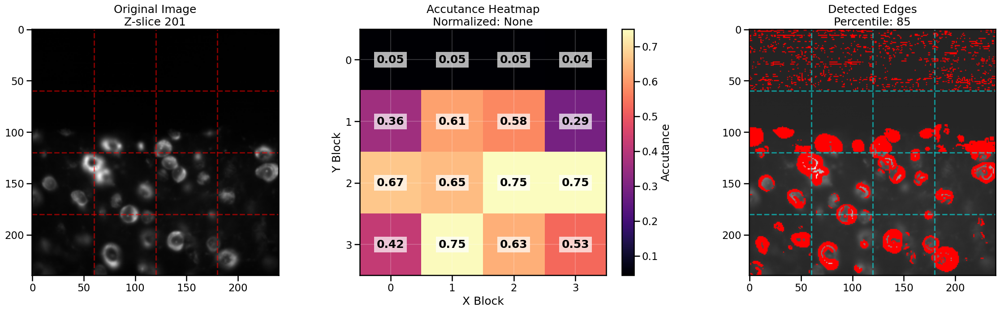

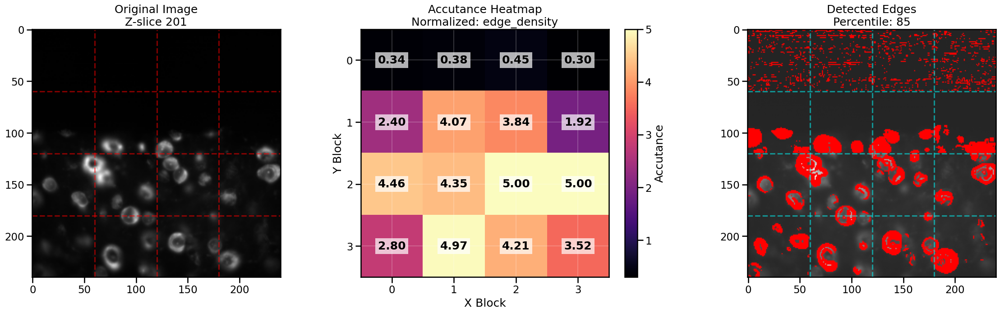

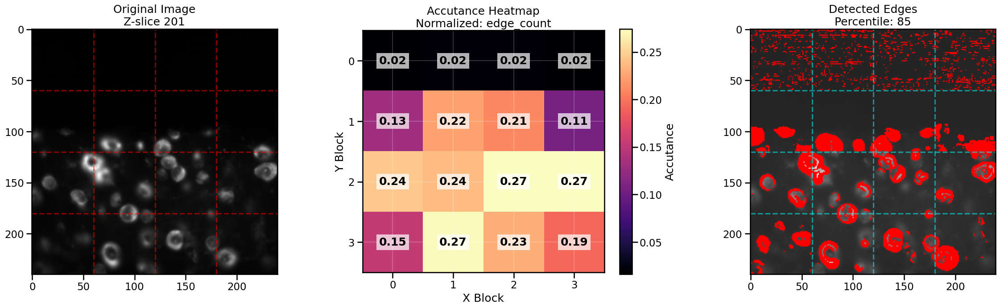

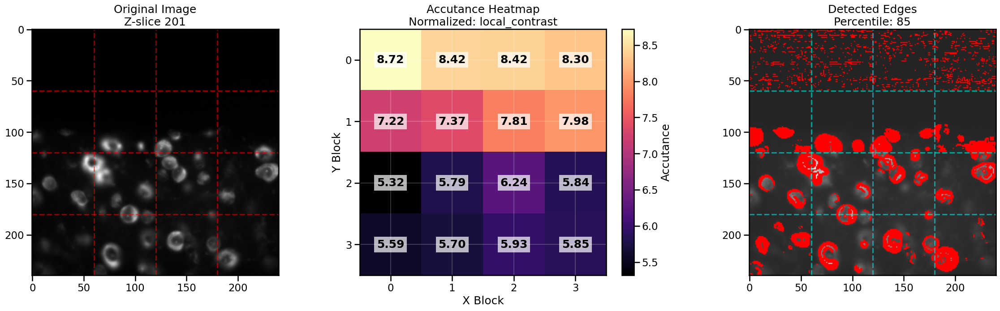

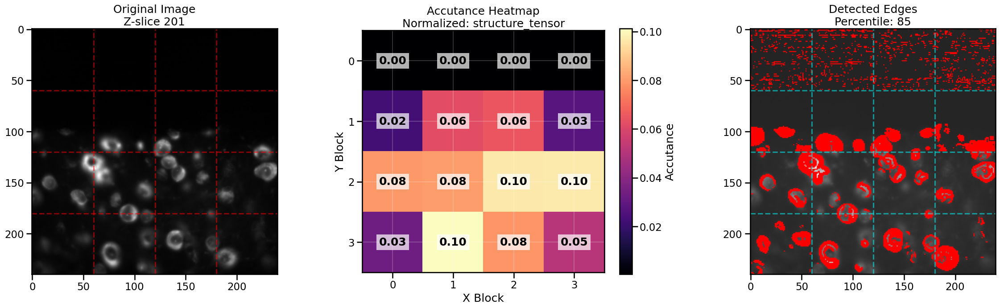

In [45]:
tile_name = tile_names[10]
tile1_data = stitch_utils.load_tile_data(tile_name, bucket_name, dataset_path, 
                                        pyramid_level,dims_order=(0,1,2))

percentile_threshold = 85       

n_blocks = 4

# Use middle of volume
fig, ax, values = stitch_utils.plot_block_accutance_heatmap(tile1_data, 
                                                            z_slice=201, 
                                                            n_blocks=n_blocks, 
                                                            percentile_threshold=percentile_threshold,
                                                            normalize_method=None)

# Use middle of volume
fig, ax, values = stitch_utils.plot_block_accutance_heatmap(tile1_data, 
                                                            z_slice=201, 
                                                            n_blocks=n_blocks, 
                                                            percentile_threshold=percentile_threshold,
                                                            normalize_method='edge_density')
# Use middle of volume
fig, ax, values = stitch_utils.plot_block_accutance_heatmap(tile1_data, 
                                                            z_slice=201, 
                                                            n_blocks=n_blocks, 
                                                            percentile_threshold=percentile_threshold,
                                                            normalize_method='edge_count')

# Use middle of volume
fig, ax, values = stitch_utils.plot_block_accutance_heatmap(tile1_data, 
                                                            z_slice=201, 
                                                            n_blocks=n_blocks, 
                                                            percentile_threshold=percentile_threshold,
                                                            normalize_method='local_contrast')

# Use middle of volume
fig, ax, values = stitch_utils.plot_block_accutance_heatmap(tile1_data, 
                                                            z_slice=201, 
                                                            n_blocks=n_blocks, 
                                                            percentile_threshold=percentile_threshold,
                                                            normalize_method='structure_tensor')


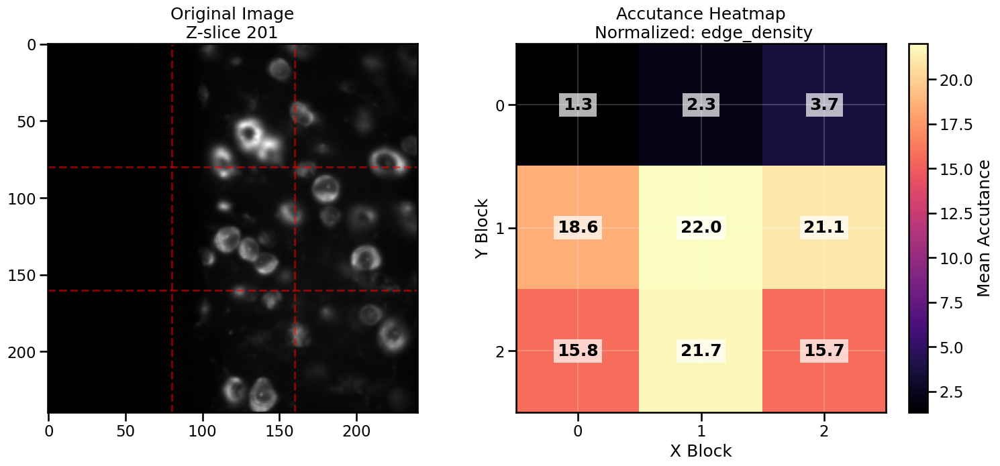

In [29]:
tile_name = tile_names[10]
tile1_data = stitch_utils.load_tile_data(tile_name, bucket_name, dataset_path, 
                                        pyramid_level,dims_order=(2,1,0))

# Use middle of volume
fig, ax, values = stitch_utils.plot_block_accutance_heatmap(tile1_data, z_slice=201, 
                                                            n_blocks=3, percentile_threshold=95,
                                                            normalize_method='edge_density')

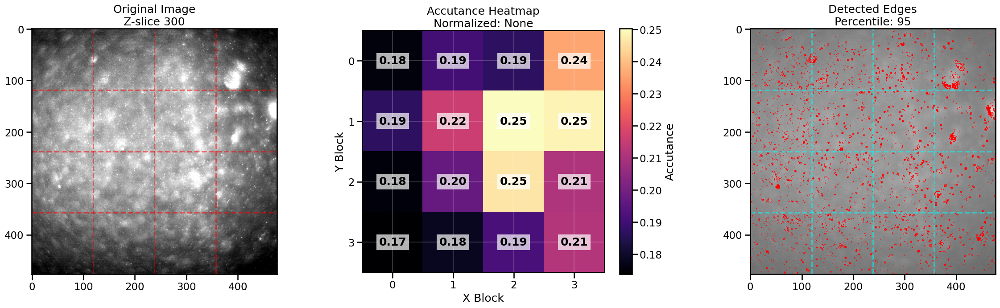

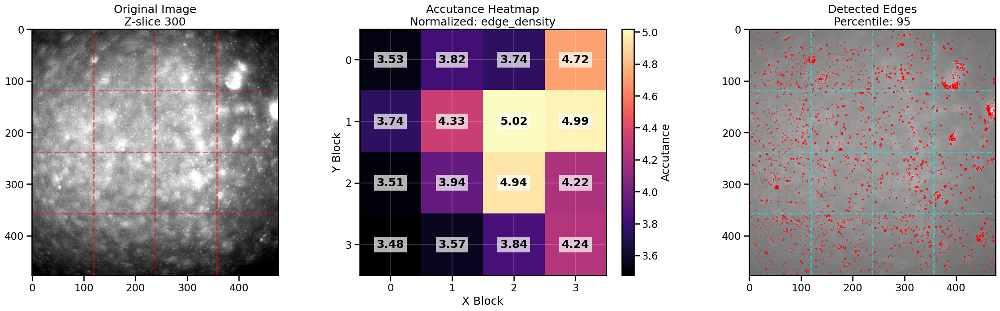

In [168]:
tile_name = tile_names[10]
pyramid_level = 2
tile1_data = stitch_utils.load_tile_data(tile_name, bucket_name, dataset_path, 
                                        pyramid_level,dims_order=(0,1,2))

percentile_threshold = 95       

n_blocks = 4

z_slice = 300

# Use middle of volume
fig, ax, values = stitch_utils.plot_block_accutance_heatmap(tile1_data, 
                                                            z_slice=z_slice, 
                                                            n_blocks=n_blocks, 
                                                            percentile_threshold=percentile_threshold,
                                                            normalize_method=None)

# Use middle of volume
fig, ax, values = stitch_utils.plot_block_accutance_heatmap(tile1_data, 
                                                            z_slice=z_slice, 
                                                            n_blocks=n_blocks, 
                                                            percentile_threshold=percentile_threshold,
                                                            normalize_method='edge_density')
# # Use middle of volume
# fig, ax, values = stitch_utils.plot_block_accutance_heatmap(tile1_data, 
#                                                             z_slice=z_slice, 
#                                                             n_blocks=n_blocks, 
#                                                             percentile_threshold=percentile_threshold,
#                                                             normalize_method='edge_count')

# # # Use middle of volume
# # fig, ax, values = stitch_utils.plot_block_accutance_heatmap(tile1_data, 
# #                                                             z_slice=z_slice, 
# #                                                             n_blocks=n_blocks, 
# #                                                             percentile_threshold=percentile_threshold,
# #                                                             normalize_method='local_contrast')

# # # Use middle of volume
# # fig, ax, values = stitch_utils.plot_block_accutance_heatmap(tile1_data, 
# #                                                             z_slice=z_slice, 
# #                                                             n_blocks=n_blocks, 
# #                                                             percentile_threshold=percentile_threshold,
# #                                                             normalize_method='structure_tensor')


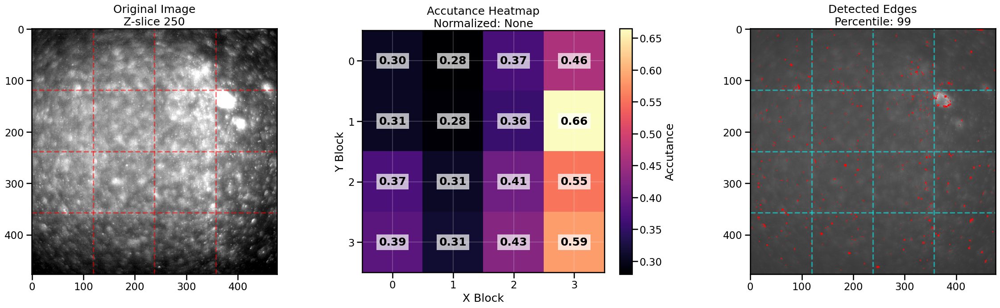

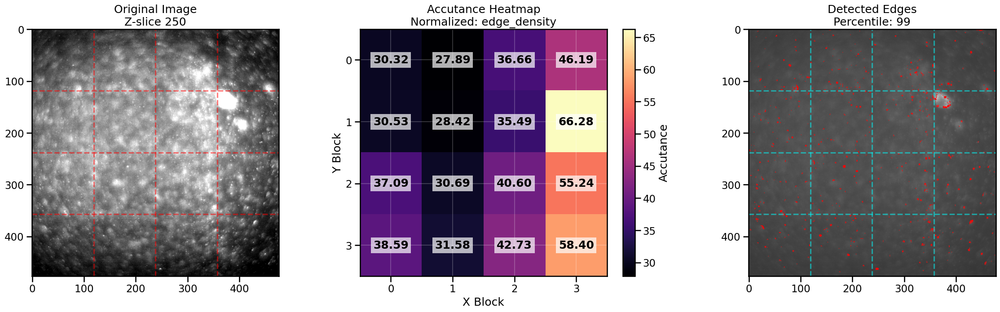

In [166]:
tile_name = tile_names[10]
pyramid_level = 2
tile1_data = stitch_utils.load_tile_data(tile_name, bucket_name, dataset_path, 
                                        pyramid_level,dims_order=(0,1,2))

percentile_threshold = 99       

n_blocks = 4

z_slice = 250

# Use middle of volume
fig, ax, values = stitch_utils.plot_block_accutance_heatmap(tile1_data, 
                                                            z_slice=z_slice, 
                                                            n_blocks=n_blocks, 
                                                            percentile_threshold=percentile_threshold,
                                                            normalize_method=None)

# Use middle of volume
fig, ax, values = stitch_utils.plot_block_accutance_heatmap(tile1_data, 
                                                            z_slice=z_slice, 
                                                            n_blocks=n_blocks, 
                                                            percentile_threshold=percentile_threshold,
                                                            normalize_method='edge_density')
# # Use middle of volume
# fig, ax, values = stitch_utils.plot_block_accutance_heatmap(tile1_data, 
#                                                             z_slice=z_slice, 
#                                                             n_blocks=n_blocks, 
#                                                             percentile_threshold=percentile_threshold,
#                                                             normalize_method='edge_count')

# # # Use middle of volume
# # fig, ax, values = stitch_utils.plot_block_accutance_heatmap(tile1_data, 
# #                                                             z_slice=z_slice, 
# #                                                             n_blocks=n_blocks, 
# #                                                             percentile_threshold=percentile_threshold,
# #                                                             normalize_method='local_contrast')

# # # Use middle of volume
# # fig, ax, values = stitch_utils.plot_block_accutance_heatmap(tile1_data, 
# #                                                             z_slice=z_slice, 
# #                                                             n_blocks=n_blocks, 
# #                                                             percentile_threshold=percentile_threshold,
# #                                                             normalize_method='structure_tensor')


# 5) Plot overlap

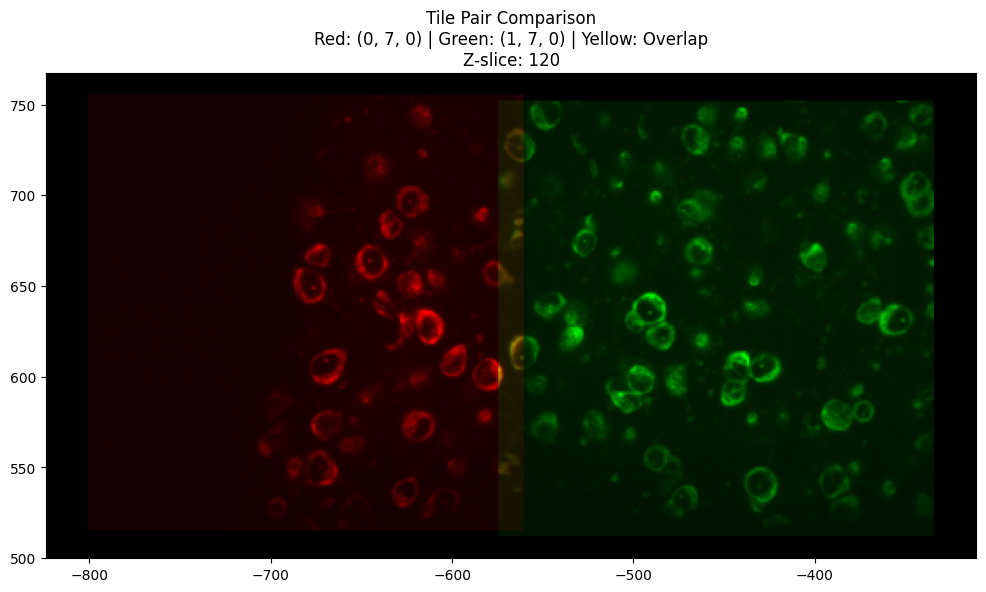

In [12]:
# Plot a single pair
pair_n = 15

fig, ax = stitch_utils.plot_adjacent_tile_pair(
    pairs[pair_n][0], pairs[pair_n][1],  # First pair of tiles
    net_transforms, tile_names,
    bucket_name, dataset_path,
    pyramid_level=3  # Use lower resolution for faster plotting
)

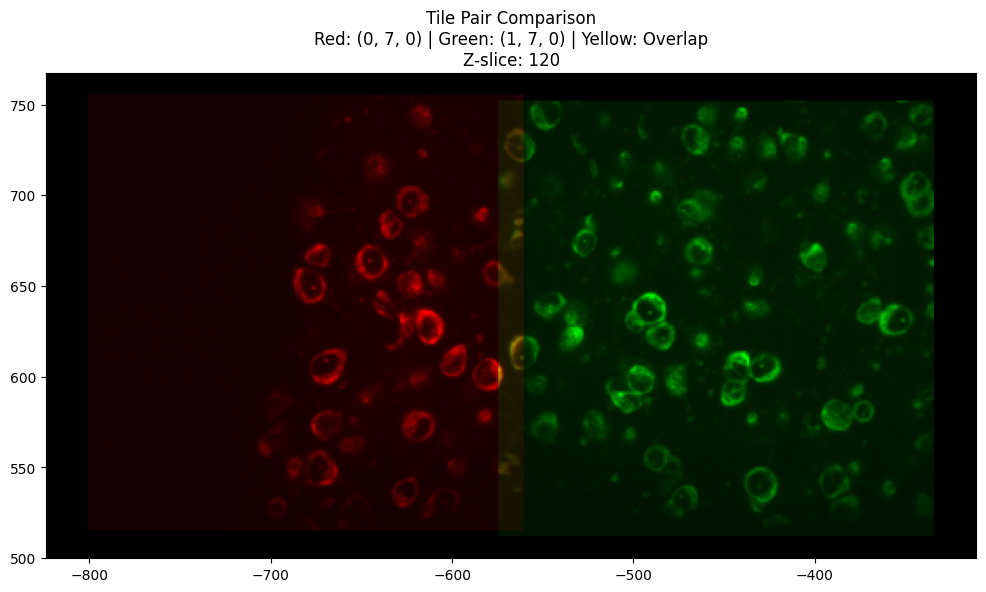

In [283]:
# Plot a single pair
pair_n = 15

fig, ax = stitch_utils.plot_adjacent_tile_pair(
    pairs[pair_n][0], pairs[pair_n][1],  # First pair of tiles
    net_transforms, tile_names,
    bucket_name, dataset_path,
    pyramid_level=3  # Use lower resolution for faster plotting
)

Z offset 1: 4
Z offset 2: 4


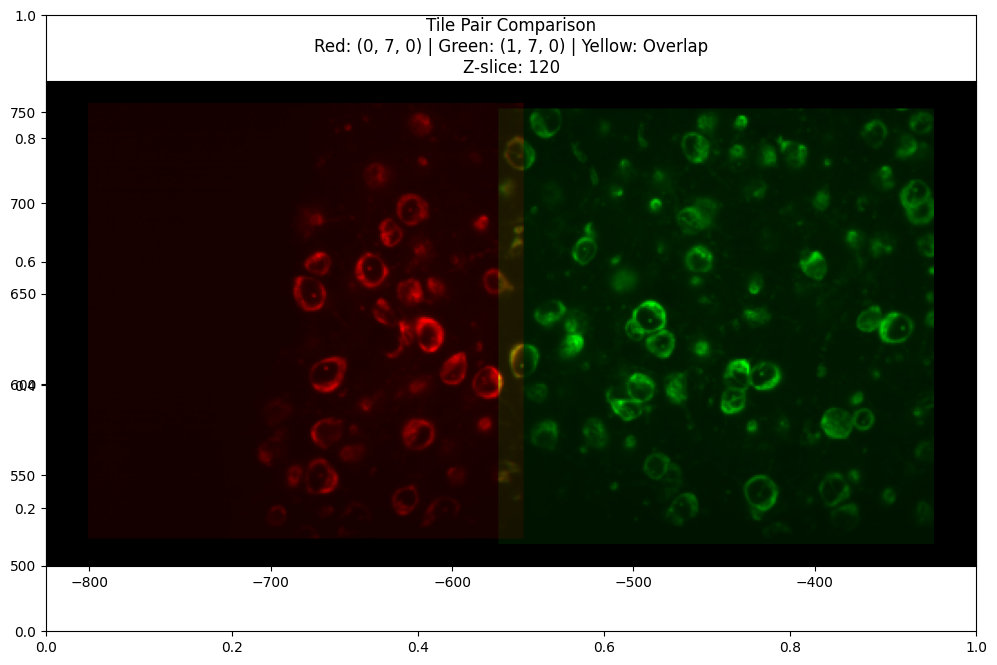

In [277]:
# Plot a single pair
pair_n = 15

fig, ax = stitch_utils.plot_adjacent_tile_pair(
    pairs[pair_n][0], pairs[pair_n][1],  # First pair of tiles
    net_transforms, tile_names,
    bucket_name, dataset_path,
    pyramid_level=3  # Use lower resolution for faster plotting
)



Z offset 1: 17
Z offset 2: 15


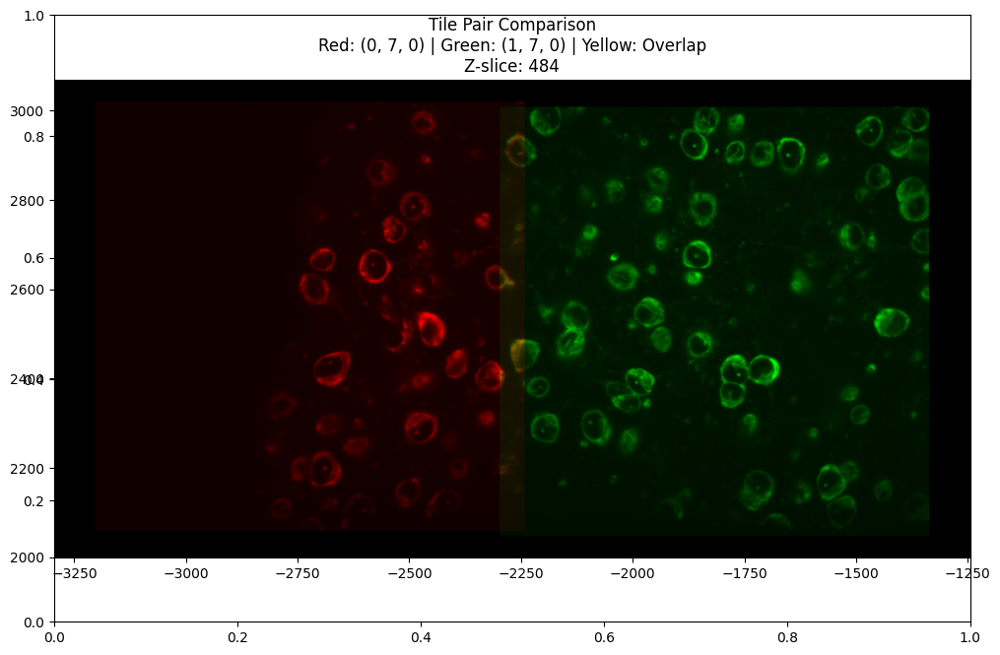

In [280]:
# Plot a single pair
pair_n = 15

fig, ax = stitch_utils.plot_adjacent_tile_pair(
    pairs[pair_n][0], pairs[pair_n][1],  # First pair of tiles
    net_transforms, tile_names,
    bucket_name, dataset_path,
    pyramid_level=1  # Use lower resolution for faster plotting
)


Z offset 1: 4
Z offset 2: 4


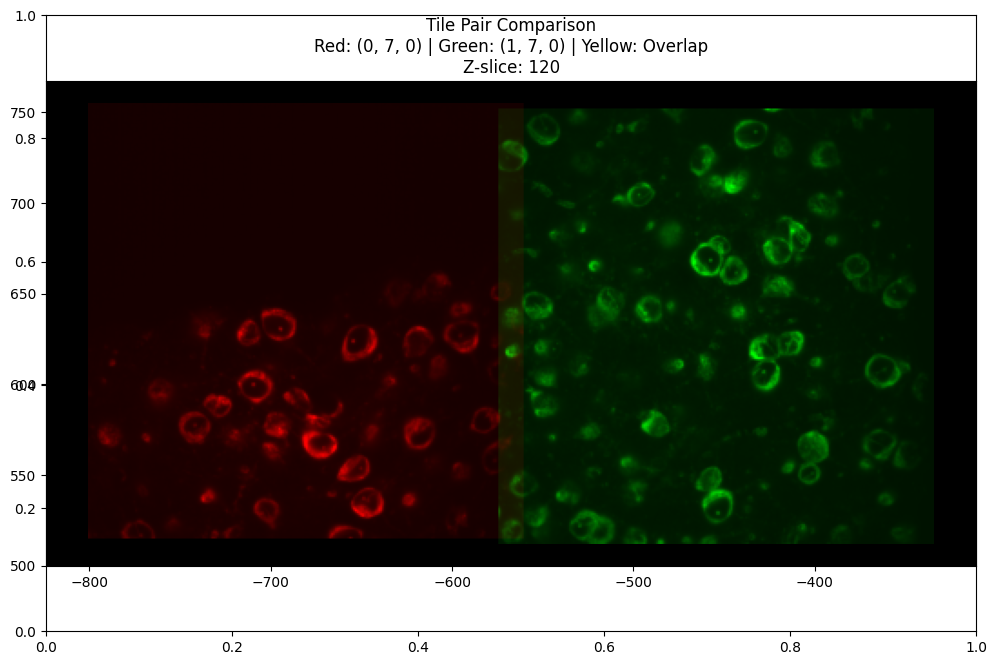

In [252]:
# Plot a single pair
pair_n = 15

fig, ax = stitch_utils.plot_adjacent_tile_pair(
    pairs[pair_n][0], pairs[pair_n][1],  # First pair of tiles
    net_transforms, tile_names,
    bucket_name, dataset_path,
    pyramid_level=3  # Use lower resolution for faster plotting
)

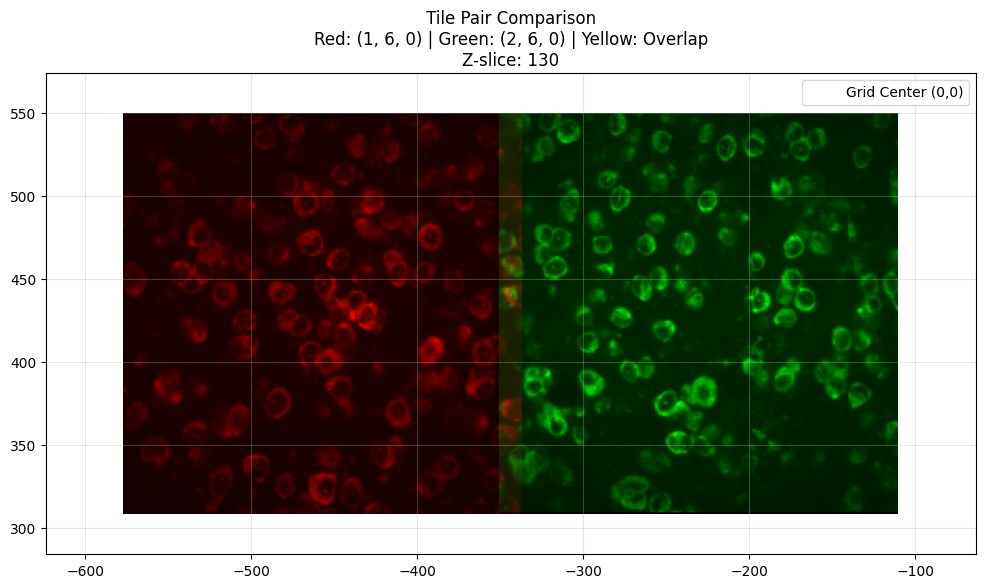

In [242]:
pair_n = 30

fig, ax = stitch_utils.plot_adjacent_tile_pair(
    pairs[pair_n][0], pairs[pair_n][1],  # First pair of tiles
    net_transforms, tile_names,
    bucket_name, dataset_path,
    pyramid_level=3  # Use lower resolution for faster plotting
)

# Plot a single pair
pair_n = 40

fig, ax = stitch_utils.plot_adjacent_tile_pair(
    pairs[pair_n][0], pairs[pair_n][1],  # First pair of tiles
    net_transforms, tile_names,
    bucket_name, dataset_path,
    pyramid_level=3  # Use lower resolution for faster plotting
)



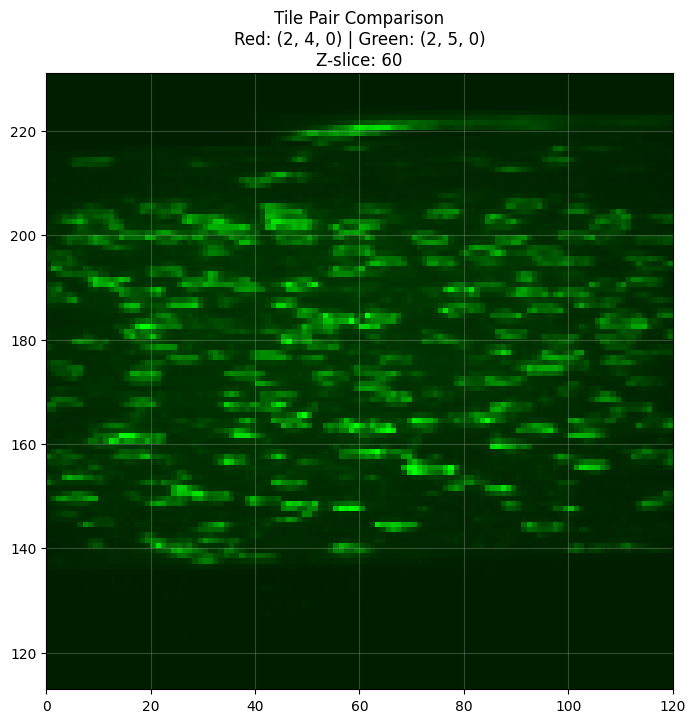

TypeError: cannot unpack non-iterable NoneType object

In [169]:
# Plot a single pair
pair_n = 42

fig, ax = stitch_utils.plot_adjacent_tile_pair(
    pairs[pair_n][0], pairs[pair_n][1],  # First pair of tiles
    net_transforms, tile_names,
    bucket_name, dataset_path,
    pyramid_level=4  # Use lower resolution for faster plotting
)



## tile compare

(480, 480, 475)
(480, 480, 475)


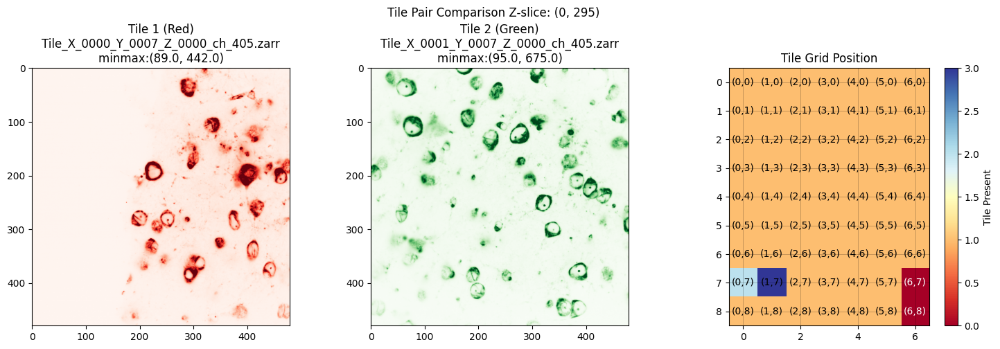

In [244]:
pair_n = 15
tile1_name = pairs[pair_n][0]
tile2_name = pairs[pair_n][1]
stitch_utils.plot_tile_comparison(tile1_name, tile2_name, 
                                  bucket_name, dataset_path,
                                  tile_dict=tile_names,
                                  pyramid_level=2, 
                                  z_slice=(0,295),
                                  minmax_percentile= (1.5,99))

(475, 480, 480)
(475, 480, 480)


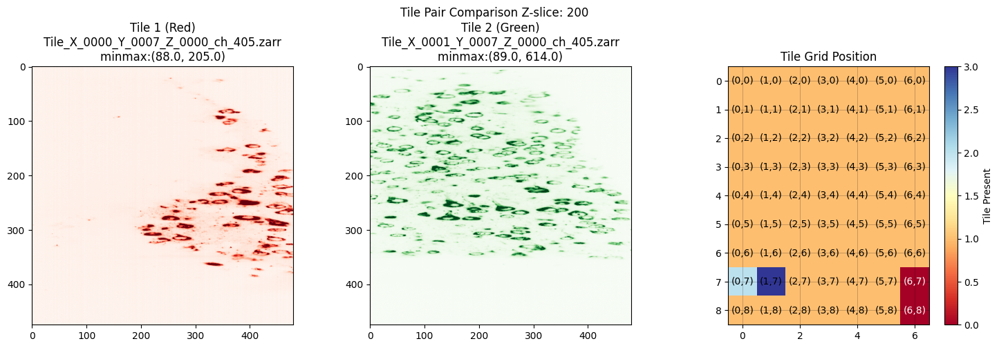

In [140]:
pair_n = 15
tile1_name = pairs[pair_n][0]
tile2_name = pairs[pair_n][1]
stitch_utils.plot_tile_comparison(tile1_name, tile2_name, 
                                  bucket_name, dataset_path,
                                  tile_dict=tile_names,
                                  pyramid_level=2, 
                                  z_slice=200,
                                  minmax_percentile= (1.5,99))

In [ ]:
# Plot multiple pairs
stitch_utils.plot_all_adjacent_pairs(
    pairs, transforms, tile_names,
    bucket_name, dataset_path,
    pyramid_level=2,
    max_pairs=5,  # Only plot first 5 pairs
    save=True,
    output_dir='tile_pair_plots'
)

plot_tiles_on_grid(
    tile1_name, tile2_name, 
    net_transforms, tile_names,
    bucket_name, dataset_path,
    n_x_tiles=7, n_y_tiles=9,  # adjust based on your grid size
    z_slice=237, 
    pyramid_level=0,
    color1='red', 
    color2='green'
)

plot_tiles_on_grid(
    tile1_name, tile2_name, 
    net_transforms, tile_names,
    bucket_name, dataset_path,
    n_x_tiles=7, n_y_tiles=9,  # adjust based on your grid size
    z_slice=237, 
    pyramid_level=0,
    color1='red', 
    color2='green'
)

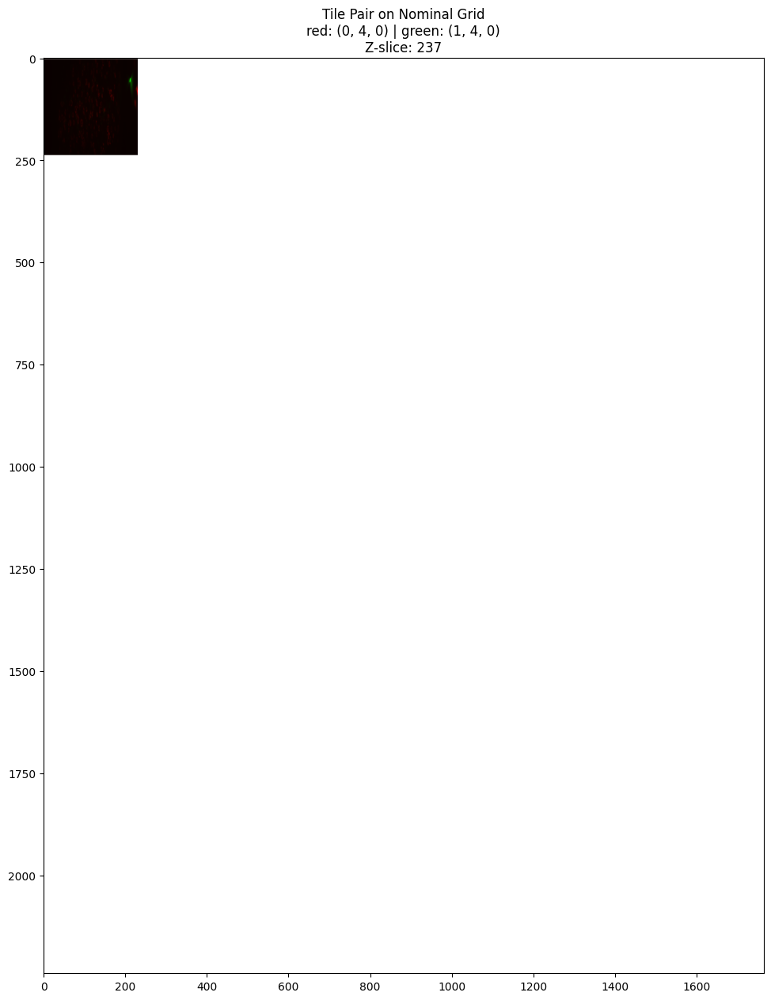

(<Figure size 1500x1500 with 1 Axes>,
 <Axes: title={'center': 'Tile Pair on Nominal Grid\nred: (0, 4, 0) | green: (1, 4, 0)\nZ-slice: 237'}>)

In [199]:
pair_n = 9
tile1_name = pairs[pair_n][0]
tile2_name = pairs[pair_n][1]

stitch_utils.plot_tiles_on_grid(
    tile1_name, tile2_name, 
    net_transforms, tile_names,
    bucket_name, dataset_path,
    n_x_tiles=7, n_y_tiles=9,  # adjust based on your grid size
    z_slice=237, 
    pyramid_level=3,
    color1='red', 
    color2='green'
)

# Transforms x,y,z

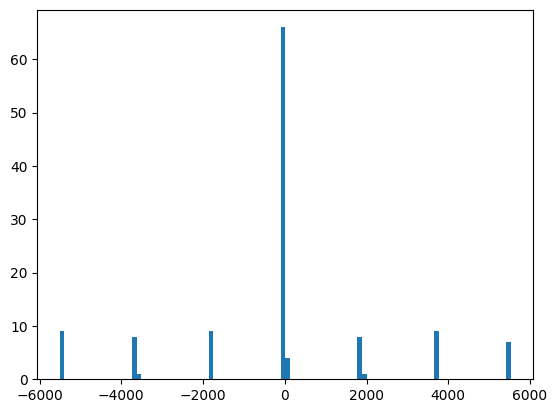

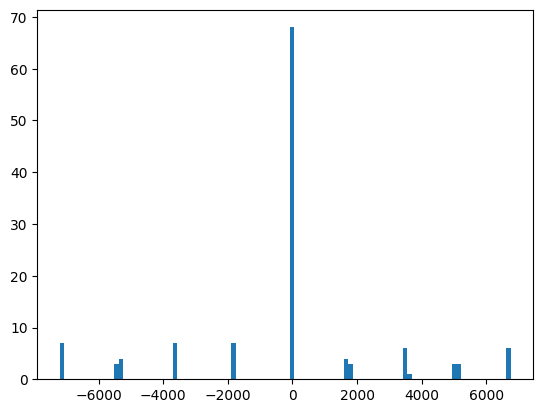

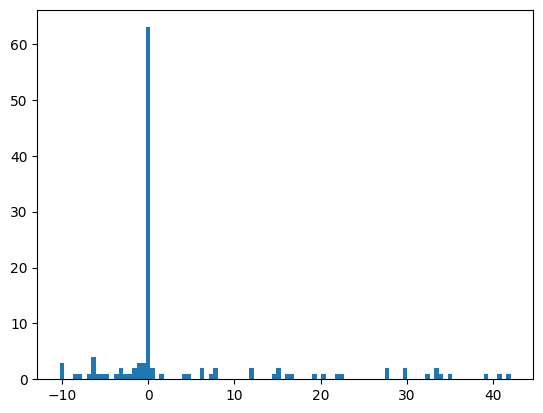

In [203]:
xt,yt,zt = stitch_utils.extract_x_y_z_transforms(net_transforms)
plt.hist(xt, bins=100)
plt.show()
plt.hist(yt, bins=100)
plt.show()
plt.hist(zt, bins=100)
plt.show()

# Transform heatmaps and occupancy

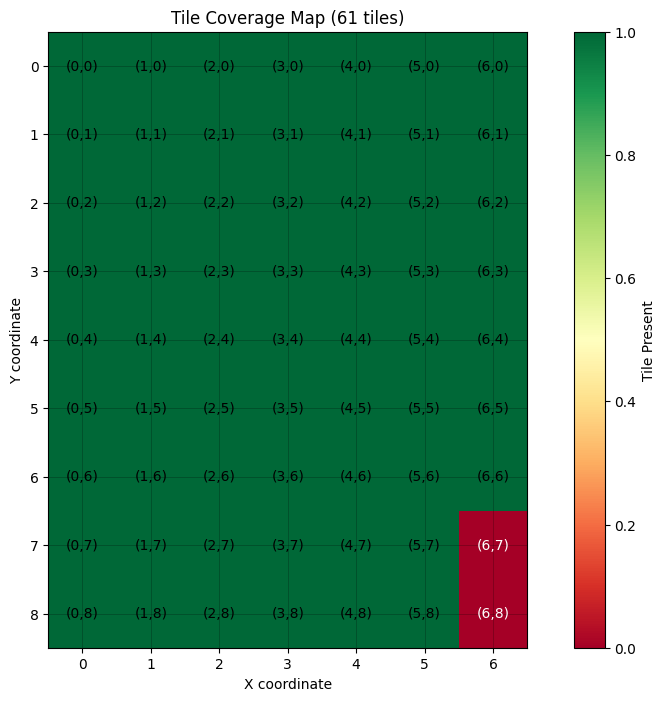

In [21]:
analysis = stitch_utils.analyze_tile_grid(tile_names)


In [27]:
net_transforms

defaultdict(<function stitch_utils.calculate_net_transforms.<locals>.<lambda>()>,
            {0: array([[ 1.00000000e+00,  0.00000000e+00,  0.00000000e+00,
                     -5.50215065e+03],
                    [ 0.00000000e+00,  1.00000000e+00,  0.00000000e+00,
                     -7.20201307e+03],
                    [ 0.00000000e+00,  0.00000000e+00,  1.00000000e+00,
                     -8.27947787e+00]]),
             1: array([[ 1.00000000e+00,  0.00000000e+00,  0.00000000e+00,
                     -5.46489640e+03],
                    [ 0.00000000e+00,  1.00000000e+00,  0.00000000e+00,
                     -5.41672993e+03],
                    [ 0.00000000e+00,  0.00000000e+00,  1.00000000e+00,
                     -6.70593816e+00]]),
             2: array([[ 1.00000000e+00,  0.00000000e+00,  0.00000000e+00,
                     -5.47241738e+03],
                    [ 0.00000000e+00,  1.00000000e+00,  0.00000000e+00,
                     -3.59857546e+03],
                 

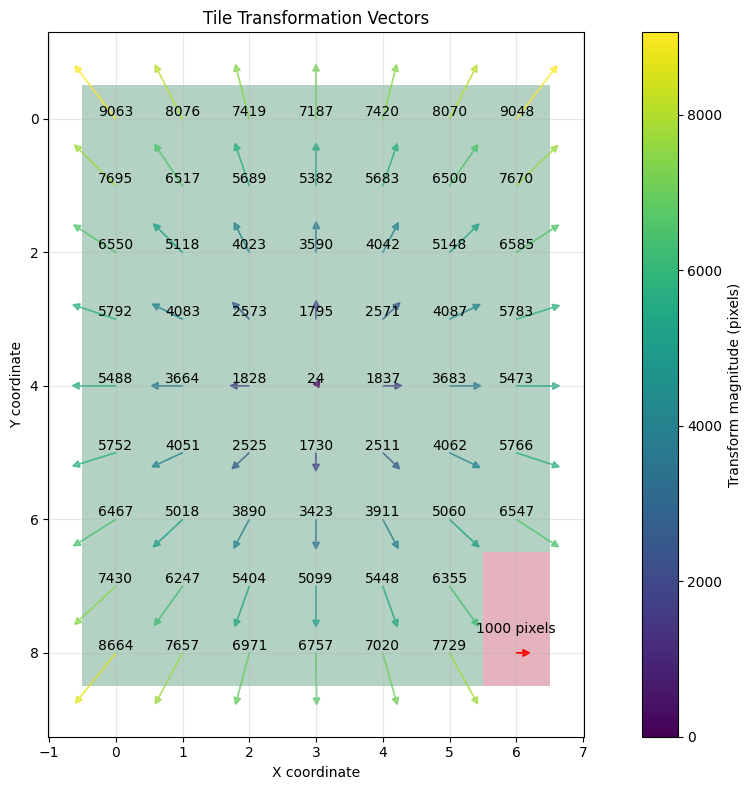

In [35]:
stitch_utils.plot_tile_transforms(tile_names, net_transforms, analysis['coverage_map'])

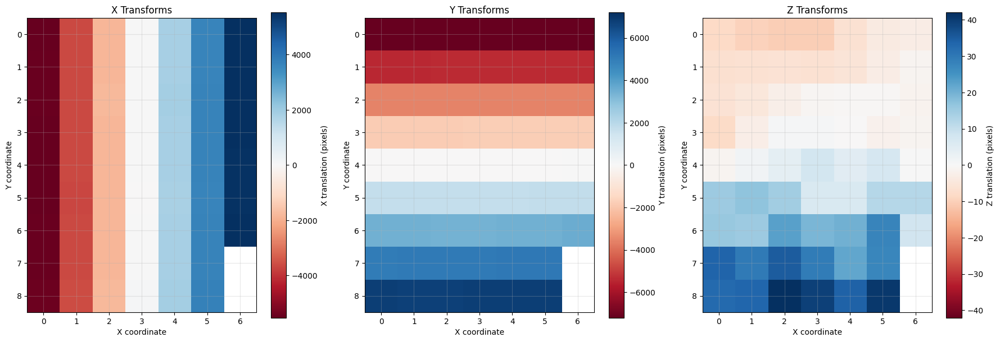

(array([[-5.50215065e+03, -3.67081234e+03, -1.83777015e+03,
          2.18969224e+00,  1.83873500e+03,  3.66814678e+03,
          5.50219042e+03],
        [-5.46489640e+03, -3.64215065e+03, -1.81738950e+03,
          1.57690324e+01,  1.84628958e+03,  3.67082245e+03,
          5.49555875e+03],
        [-5.47241738e+03, -3.64220507e+03, -1.81356260e+03,
          2.58593741e+01,  1.86426237e+03,  3.69754773e+03,
          5.52908656e+03],
        [-5.48803397e+03, -3.64846172e+03, -1.82172429e+03,
          2.07415258e+01,  1.85359974e+03,  3.68346977e+03,
          5.51003448e+03],
        [-5.48826338e+03, -3.66409669e+03, -1.82752770e+03,
          1.30292570e+01,  1.83692984e+03,  3.68320925e+03,
          5.47266189e+03],
        [-5.49598739e+03, -3.67229620e+03, -1.84572199e+03,
         -1.30064112e+01,  1.81373008e+03,  3.65414462e+03,
          5.47814462e+03],
        [-5.47859076e+03, -3.65563470e+03, -1.84156892e+03,
          4.79174788e+00,  1.84071073e+03,  3.69412582e+03

In [43]:
stitch_utils.plot_transform_heatmaps(tile_names, 
                                     net_transforms, 
                                     analysis['coverage_map'],
                                     remove_nominal_transform=False)

overlap = 0.05
tile_dims=(1820,1820,1902)

In [62]:
tile_dims = (1902, 1920, 1920)
overlap = 0.05
tile_overlap_adjust = 1 - overlap
tile_dims = tuple(int(dim * tile_overlap_adjust) for dim in tile_dims)
tile_dims


(1806, 1824, 1824)

[-5420.7 -3613.8 -1806.9     0.   1806.9  3613.8  5420.7]
[-7296. -5472. -3648. -1824.     0.  1824.  3648.  5472.  7296.]


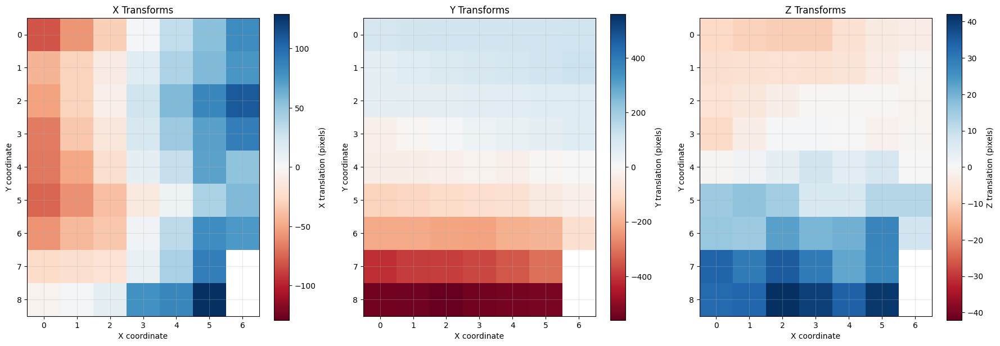

(array([[-81.45065242, -57.01234496, -30.87015018,   2.18969224,
          31.83499922,  54.3467818 ,  81.49041773],
        [-44.19640323, -28.35065242, -10.48950461,  15.76903242,
          39.38957899,  57.02244508,  74.85874696],
        [-51.71737504, -28.40506947,  -6.66260473,  25.85937406,
          57.36237402,  83.74772889, 108.38655692],
        [-67.3339678 , -34.66172172, -14.82429407,  20.74152575,
          46.69973744,  69.66976515,  89.3344767 ],
        [-67.56338233, -50.29668776, -20.62770384,  13.02925703,
          30.02984047,  69.40924585,  51.96188954],
        [-75.28739458, -58.4961993 , -38.82199131, -13.0064112 ,
           6.83007598,  40.34462438,  57.44462438],
        [-57.890761  , -41.83470397, -34.66892128,   4.79174788,
          33.81073495,  80.32581536,  74.51752229],
        [-23.69231533, -21.06754034, -18.63200565,   9.35020259,
          41.97275405,  89.31667334,          nan],
        [ -4.17071151,   1.67005078,  11.34018252,  77.9542412 ,

In [76]:
tile_dims = (1902, 1920, 1920)
stitch_utils.plot_transform_heatmaps(tile_names, 
                                     net_transforms, 
                                     analysis['coverage_map'],
                                     remove_nominal_transform=True,
                                     tile_dims=tile_dims,
                                     overlap=0.05)

In [15]:
parsers.XmlParser.extract_tile_transforms(xml_path=xml_path)

{0: [{'@type': 'affine',
   'Name': 'Translation to Nominal Grid',
   'affine': '1.0 0.0 0.0 -5472.0 0.0 1.0 0.0 -7295.0 0.0 0.0 1.0 0.0'},
  {'@type': 'affine',
   'Name': 'Stitching Transform',
   'affine': '1.0 0.0 0.0 -30.29604980903514 0.0 1.0 0.0 95.35672878874175 0.0 0.0 1.0 -7.32590609139254'},
  {'@type': 'affine',
   'Name': 'baked bdv manual transform',
   'affine': '1.0 0.0 0.0 0.0 0.0 1.0 0.0 0.0 0.0 0.0 1.0 0.0'},
  {'@type': 'affine',
   'Name': 'Stitching Transform',
   'affine': '1.0 0.0 0.0 -2.8744531759034544 0.0 1.0 0.0 -5.6205317490976086 0.0 0.0 1.0 -0.637134739464841'},
  {'@type': 'affine',
   'Name': 'baked bdv manual transform',
   'affine': '1.0 0.0 0.0 0.0 0.0 1.0 0.0 0.0 0.0 0.0 1.0 0.0'},
  {'@type': 'affine',
   'Name': 'Stitching Transform',
   'affine': '1.0 0.0 0.0 3.019850566216519 0.0 1.0 0.0 3.250734949402613 0.0 0.0 1.0 -0.3164370347167278'},
  {'@type': 'affine',
   'Name': 'baked bdv manual transform',
   'affine': '1.0 0.0 0.0 0.0 0.0 1.0 0.0 0.

In [16]:

parsers.XmlParser.extract_info(xml_path=xml_path)




((0.2466335423895654, 0.2466335423895654, 1.0),
 {0: 'Tile_X_0000_Y_0000_Z_0000_ch_405.zarr',
  1: 'Tile_X_0000_Y_0001_Z_0000_ch_405.zarr',
  2: 'Tile_X_0000_Y_0002_Z_0000_ch_405.zarr',
  3: 'Tile_X_0000_Y_0003_Z_0000_ch_405.zarr',
  4: 'Tile_X_0000_Y_0004_Z_0000_ch_405.zarr',
  5: 'Tile_X_0000_Y_0005_Z_0000_ch_405.zarr',
  6: 'Tile_X_0000_Y_0006_Z_0000_ch_405.zarr',
  7: 'Tile_X_0000_Y_0007_Z_0000_ch_405.zarr',
  8: 'Tile_X_0000_Y_0008_Z_0000_ch_405.zarr',
  9: 'Tile_X_0001_Y_0000_Z_0000_ch_405.zarr',
  10: 'Tile_X_0001_Y_0001_Z_0000_ch_405.zarr',
  11: 'Tile_X_0001_Y_0002_Z_0000_ch_405.zarr',
  12: 'Tile_X_0001_Y_0003_Z_0000_ch_405.zarr',
  13: 'Tile_X_0001_Y_0004_Z_0000_ch_405.zarr',
  14: 'Tile_X_0001_Y_0005_Z_0000_ch_405.zarr',
  15: 'Tile_X_0001_Y_0006_Z_0000_ch_405.zarr',
  16: 'Tile_X_0001_Y_0007_Z_0000_ch_405.zarr',
  17: 'Tile_X_0001_Y_0008_Z_0000_ch_405.zarr',
  18: 'Tile_X_0002_Y_0000_Z_0000_ch_405.zarr',
  19: 'Tile_X_0002_Y_0001_Z_0000_ch_405.zarr',
  20: 'Tile_X_0002_Y_0